In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import time

#### Функции для реализации методов Momentum, RMSprop и Adam

In [2]:
def measure_optimizer_performance(optimizer_func, X, y, learning_rates, hyperparams, epochs=100, convergence_threshold=1e-5):
    """
    Функция для измерения времени выполнения и точности сходимости
    
    Аргументы: 
        optimizer_func: функция оптимизации
        X: матрица признаков
        y: вектор целевых значений
        learning_rates: список скоростей обучения 
        hyperparams: список параметров
        epochs: количество эпох обучения
        convergence_threshold: пороговое значение точности сходимости
    """    
    results = []
    for lr in learning_rates:
        for param_set in hyperparams:
            start_time = time.time()
            weights, gradients, weights_traj = optimizer_func(X, y, lr, *param_set, epochs)
            end_time = time.time()
            # время выполнения
            execution_time = end_time - start_time
            
            # точность сходимости
            convergence_accuracy = np.linalg.norm(gradients[-1]) 
            
            results.append({'Learning Rate': lr, 'Hyperparameters': param_set, 
                            'Execution Time': execution_time, 'Final Weights': weights, 
                            'Gradients': gradients, 'Weights Trajectory': weights_traj, 
                            'Convergence Accuracy': convergence_accuracy})
    return results

In [3]:
def plot_gradients(results, optimizer_name):
    """
    Функция для визуализации изменения значений градиентов по эпохам
    
    Аргументы: 
        results: список результатов оптимизатора, содержащий словари с данными о градиентах
        optimizer_name: имя оптимизатора, которому соответствуют результаты
    """
    plt.figure(figsize=(15, 6))
    for i in range(len(results)):
        if optimizer_name == 'Momentum':
            label = f"LR={results[i]['Learning Rate']}, Momentum={results[i]['Hyperparameters']}"
        elif optimizer_name == 'RMSprop':
            label = f"LR={results[i]['Learning Rate']}, Beta={results[i]['Hyperparameters']}"
        elif optimizer_name == 'Adam':
            label = f"LR={results[i]['Learning Rate']}, Betas={results[i]['Hyperparameters']}"
        else:
            label = f"LR={results[i]['Learning Rate']}"

        plt.plot(range(len(results[i]['Gradients'])), results[i]['Gradients'], label=label)

    plt.title(f'Изменение градиентов {optimizer_name} по эпохам')
    plt.xlabel('Эпоха')
    plt.ylabel('Норма градиента')
    plt.grid(True)
    plt.legend()
    plt.show()

In [4]:
def plot_weight_levels(X, y, w_history: np.ndarray, function_name, learning_rate, hyperparams, subplot):
    """
    Функция используется для визуализации уровней веса и траектории градиентного спуска
    
    Аргументы: 
        X: матрица признаков
        y: вектор целевых значений
        w_history: история значений весов при каждой итерации градиентного спуска
        function_name: название оптимизатора
        learning_rate: скорость обучения
        hyperparams: параметры оптимизаторов
        subplot: расположение графика на фигуре
    """
    # массивы, содержащие равномерно распределенные значения весов
    w1_vals = np.linspace(min(w_history[:, 0]) - 1, max(w_history[:, 0]) + 1, 100)
    w2_vals = np.linspace(min(w_history[:, 1]) - 1, max(w_history[:, 1]) + 1, 100)
    
    # создание сеток
    W1, W2 = np.meshgrid(w1_vals, w2_vals)
    J_vals = np.zeros_like(W1)

    # массив J_vals для хранения значений функционала потерь для каждой комбинации весов
    for i in range(len(w1_vals)):
        for j in range(len(w2_vals)):
            w_tmp = np.array([W1[i, j], W2[i, j]])
            J_vals[i, j] = np.mean((X[:, :2].dot(w_tmp) - y) ** 2) / 2

    plt.subplot(subplot)
    plt.contour(W1, W2, J_vals, levels=30, cmap='viridis')

    # точки последней итерации градиентного спуска, обозначенные звездочкой
    plt.scatter(w_history[-1][0], w_history[-1][1], marker='*', s=100, color='black', label='Final Point')
    # траектория градиентного спуска, обозначенная красными точками
    plt.plot(w_history[:, 0], w_history[:, 1], marker='o', linestyle='-', color='red', label='Gradient Descent Trajectory')

    plt.title(f'Function: {function_name}, \nLR: {learning_rate}, \nHyperparams: {hyperparams}')
    plt.xlabel('Weight 1')
    plt.ylabel('Weight 2')
    plt.legend()

def optimizer_performance_plot(optimizer_func, X, y, learning_rates, hyperparams):
    num_plots = len(learning_rates) * len(hyperparams)
    fig = plt.figure(figsize=(12, 6*num_plots))

    plot_num = 1
    for lr in learning_rates:
        for param in hyperparams:
            if isinstance(param, tuple):
                result = optimizer_func(X, y, lr, *param)
            else:
                result = optimizer_func(X, y, lr, param)
            
            _, _, weights_trajectory = result
            w_history = np.array(weights_trajectory)
            function_name = optimizer_func.__name__
            subplot = int(str(len(learning_rates)) + str(len(hyperparams)) + str(plot_num))
            plot_weight_levels(X, y, w_history, function_name, lr, param, subplot)
            plot_num += 1

    plt.tight_layout()
    plt.show()

## Метод инерции (momentum)

In [5]:
def momentum_gradient_descent(X, y, lr, gamma=0.9, epochs=100):
    w = np.zeros(X.shape[1])
    v = np.zeros(X.shape[1])

    gradients = []
    # сохранение траектории весов
    weights_trajectory = [w.copy()]  

    for _ in range(epochs):
        y_pred = np.dot(X, w)
        error = y - y_pred
        gradient = np.dot(X.T, error) / len(y)

        v = gamma * v + lr * gradient
        w += v

        gradients.append(np.linalg.norm(gradient))
        weights_trajectory.append(w.copy())

    return w, gradients, weights_trajectory

In [6]:
# параметры для экспериментов
learning_rates = [0.01, 0.05, 0.1]
momentums = [0.5, 0.9, 0.95]

### ◾️ Размерность: 1000х4

In [7]:
np.random.seed(42)
X_1 = np.random.rand(1000, 4)  # матрица X размером 1000x5
y_1 = np.random.randint(0, 2, 1000)  # вектор y с бинарными значениями

In [8]:
results_momentum_1000_performance = measure_optimizer_performance(momentum_gradient_descent, X_1, y_1, learning_rates, hyperparams=[(gamma,) for gamma in momentums])
df_momentum_1000 = pd.DataFrame(results_momentum_1000_performance)
df_momentum_1000

,Learning Rate,Hyperparameters,Execution Time,Final Weights,Gradients,Weights Trajectory,Convergence Accuracy
0,0.01,"(0.5,)",0.007509,"[0.2065863089861219, 0.21073658853215893, 0.20...","[0.505672020839188, 0.5002438547621523, 0.4921...","[[0.0, 0.0, 0.0, 0.0], [0.002528659131280622, ...",0.057540
1,0.01,"(0.9,)",0.006001,"[0.22071296727444645, 0.2424264635216361, 0.22...","[0.505672020839188, 0.5002438547621523, 0.4899...","[[0.0, 0.0, 0.0, 0.0], [0.002528659131280622, ...",0.002774
2,0.01,"(0.95,)",0.005005,"[0.2259024243605655, 0.26010199311938337, 0.24...","[0.505672020839188, 0.5002438547621523, 0.4897...","[[0.0, 0.0, 0.0, 0.0], [0.002528659131280622, ...",0.036492
3,0.05,"(0.5,)",0.006007,"[0.2193931310577262, 0.24140783282761255, 0.22...","[0.505672020839188, 0.47853121823098466, 0.439...","[[0.0, 0.0, 0.0, 0.0], [0.012643295656403111, ...",0.001569
4,0.05,"(0.9,)",0.006003,"[0.20606860990488216, 0.24626559697190822, 0.2...","[0.505672020839188, 0.47853121823098466, 0.428...","[[0.0, 0.0, 0.0, 0.0], [0.012643295656403111, ...",0.001677
5,0.05,"(0.95,)",0.006000,"[0.21133625485277155, 0.24799674607024713, 0.2...","[0.505672020839188, 0.47853121823098466, 0.427...","[[0.0, 0.0, 0.0, 0.0], [0.012643295656403111, ...",0.015842
6,0.10,"(0.5,)",0.004984,"[0.2113847255337156, 0.24399901774208096, 0.22...","[0.505672020839188, 0.4513904925808852, 0.3757...","[[0.0, 0.0, 0.0, 0.0], [0.025286591312806223, ...",0.000656
7,0.10,"(0.9,)",0.004986,"[0.20638189532647927, 0.24615146799387053, 0.2...","[0.505672020839188, 0.4513904925808852, 0.3540...","[[0.0, 0.0, 0.0, 0.0], [0.025286591312806223, ...",0.000192
8,0.10,"(0.95,)",0.005014,"[0.20989448088877413, 0.25261267749146193, 0.2...","[0.505672020839188, 0.4513904925808852, 0.3513...","[[0.0, 0.0, 0.0, 0.0], [0.025286591312806223, ...",0.000517


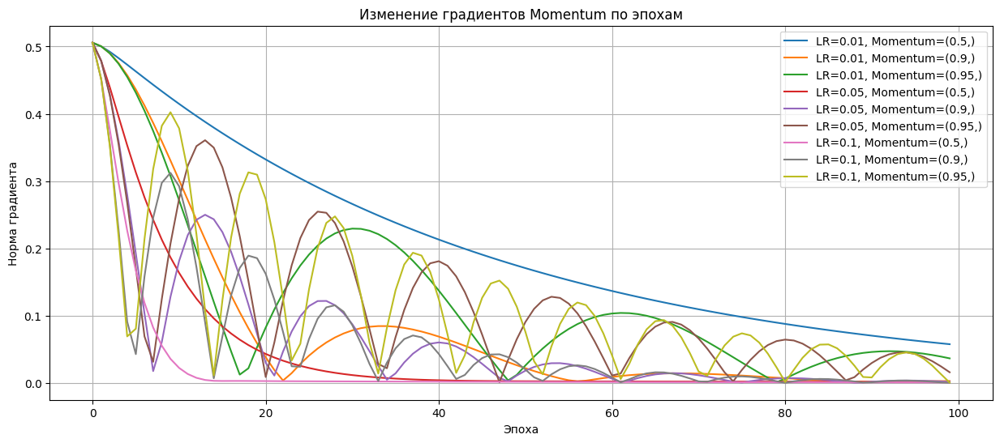

In [9]:
plot_gradients(results_momentum_1000_performance, 'Momentum')

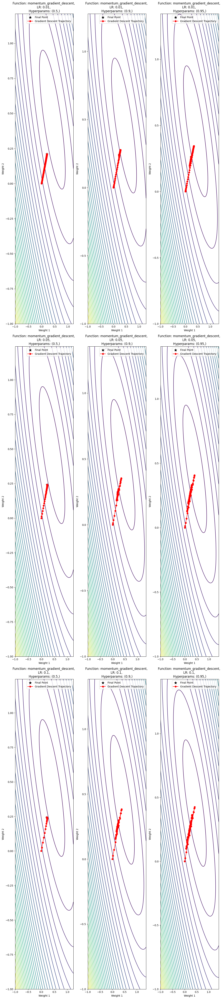

In [10]:
optimizer_performance_plot(momentum_gradient_descent, X_1, y_1, learning_rates, hyperparams=[(gamma,) for gamma in momentums])

* **Learning Rate:** 
    - Увеличение learning rate приводит к уменьшению времени выполнения, так как метод быстрее сходится к оптимальному решению. Например, при learning rate 0.01 Execution Time составляет около 0.005-0.006, в то время как при learning rate 0.10 Execution Time снижается до 0.004-0.005. Нужно учитывать, что слишком большой learning rate может привести к неустойчивости и перепрыгиванию оптимального решения.
    - Более высокие показатели точности сходимости обычно достигаются при использовании более низкого learning rate (0.01).

* **Hyperparameters:** 
    - Hyperparameter 0.9 показывает хорошие результаты в большинстве случаев, обеспечивая более быструю сходимость и более высокую точность.
    - Hyperparameter 0.95 также дает хорошие результаты, но в некоторых случаях может привести к медленной сходимости.

* **Convergence Accuracy:**
   - Точность сходимости показывает, насколько близко финальные веса к оптимальному решению.
   - Самый высокий показатель точности сходимости (0.002774) был достигнут при learning rate 0.01 и hyperparameter 0.9.
   - При более высоких learning rate (0.05 и 0.10) точность сходимости снижается.

### ◾️ Размерность: 10000х4

In [11]:
np.random.seed(42)
X_2 = np.random.rand(10000, 4)  # матрица X размером 10000x5
y_2 = np.random.randint(0, 2, 10000)  # вектор y с бинарными значениями

In [12]:
results_momentum_10000_performance = measure_optimizer_performance(momentum_gradient_descent, X_2, y_2, learning_rates, hyperparams=[(gamma,) for gamma in momentums])
df_momentum_10000 = pd.DataFrame(results_momentum_10000_performance)
df_momentum_10000

,Learning Rate,Hyperparameters,Execution Time,Final Weights,Gradients,Weights Trajectory,Convergence Accuracy
0,0.01,"(0.5,)",0.035003,"[0.20454085773034672, 0.2040556796057654, 0.20...","[0.4981535664015566, 0.4927697788098283, 0.484...","[[0.0, 0.0, 0.0, 0.0], [0.0024869217096206977,...",0.055765
1,0.01,"(0.9,)",0.020000,"[0.22895938882542255, 0.2301161412560842, 0.24...","[0.4981535664015566, 0.4927697788098283, 0.482...","[[0.0, 0.0, 0.0, 0.0], [0.0024869217096206977,...",0.002426
2,0.01,"(0.95,)",0.019002,"[0.24140594323699086, 0.2438009868504138, 0.25...","[0.4981535664015566, 0.4927697788098283, 0.482...","[[0.0, 0.0, 0.0, 0.0], [0.0024869217096206977,...",0.035256
3,0.05,"(0.5,)",0.021003,"[0.22782103742688983, 0.2290255870078561, 0.23...","[0.4981535664015566, 0.47123463384005493, 0.43...","[[0.0, 0.0, 0.0, 0.0], [0.012434608548103488, ...",0.000700
4,0.05,"(0.9,)",0.031001,"[0.22596740679105734, 0.22927230135290913, 0.2...","[0.4981535664015566, 0.47123463384005493, 0.42...","[[0.0, 0.0, 0.0, 0.0], [0.012434608548103488, ...",0.001466
5,0.05,"(0.95,)",0.028001,"[0.2275324399233507, 0.23053860501572235, 0.24...","[0.4981535664015566, 0.47123463384005493, 0.42...","[[0.0, 0.0, 0.0, 0.0], [0.012434608548103488, ...",0.012666
6,0.10,"(0.5,)",0.019001,"[0.2265991293583146, 0.2289513399856924, 0.243...","[0.4981535664015566, 0.44431571624284266, 0.36...","[[0.0, 0.0, 0.0, 0.0], [0.024869217096206975, ...",0.000302
7,0.10,"(0.9,)",0.019001,"[0.2262321084195572, 0.22947454353397076, 0.24...","[0.4981535664015566, 0.44431571624284266, 0.34...","[[0.0, 0.0, 0.0, 0.0], [0.024869217096206975, ...",0.000501
8,0.10,"(0.95,)",0.018001,"[0.23330760584358978, 0.23671869824374484, 0.2...","[0.4981535664015566, 0.44431571624284266, 0.34...","[[0.0, 0.0, 0.0, 0.0], [0.024869217096206975, ...",0.004929


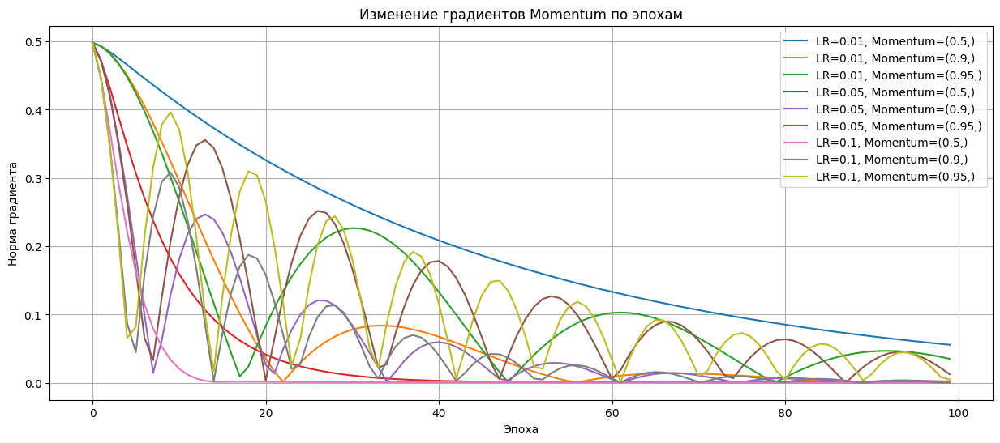

In [13]:
plot_gradients(results_momentum_10000_performance, 'Momentum')

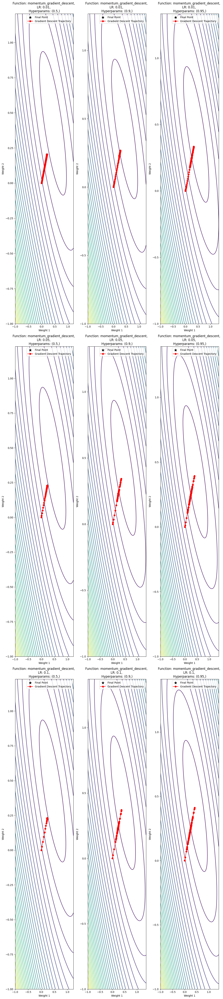

In [14]:
optimizer_performance_plot(momentum_gradient_descent, X_2, y_2, learning_rates, hyperparams=[(gamma,) for gamma in momentums])

* **Learning Rate:**
   - Увеличение learning rate с 0.01 до 0.10 приводит к увеличению времени выполнения и изменению значений финальных весов, но точность сходимости также повышается.

* **Hyperparameters:**
   - Сочетание hyperparameters 0.9 демонстрирует самую высокую точность сходимости (0.002426) для размерности 10000x4 с learning rate 0.01, что указывает на эффективное обновление весов.

* **Execution Time:**
   - Время выполнения метода инерции не сильно меняется при изменении learning rate и hyperparameters.

* **Convergence Accuracy:**
   - Сочетание learning rate 0.01 и hyperparameters 0.9 демонстрирует самую высокую точность сходимости (0.002426) для размерности 10000x4, что указывает на эффективность метода инерции при данных параметрах.

## RMSprop

In [15]:
def rmsprop(X, y, lr, beta=0.9, epsilon=1e-8, epochs=100):
    w = np.zeros(X.shape[1])
    cache = np.zeros(X.shape[1])

    gradients = []
    weights_trajectory = [w.copy()]

    for _ in range(epochs):
        y_pred = np.dot(X, w)
        error = y - y_pred
        gradient = np.dot(X.T, error) / len(y)

        cache = beta * cache + (1 - beta) * (gradient ** 2)
        w += lr * gradient / (np.sqrt(cache) + epsilon)

        gradients.append(np.linalg.norm(gradient))
        weights_trajectory.append(w.copy())

    return w, gradients, weights_trajectory

In [16]:
# Параметры для экспериментов
learning_rates = [0.01, 0.05, 0.1]
betas_rmsprop = [0.9, 0.95, 0.99]

### ◾️ Размерность: 1000х4

In [17]:
results_rmsprop_1000_performance = measure_optimizer_performance(rmsprop, X_1, y_1, learning_rates, hyperparams=[(beta,) for beta in betas_rmsprop])
df_rmsprop_1000 = pd.DataFrame(results_rmsprop_1000_performance)
df_rmsprop_1000

,Learning Rate,Hyperparameters,Execution Time,Final Weights,Gradients,Weights Trajectory,Convergence Accuracy
0,0.01,"(0.9,)",0.012000,"[0.0025091909117379886, 0.0025144658084934003,...","[0.505672020839188, 0.5056177825423538, 0.5055...","[[0.0, 0.0, 0.0, 0.0], [2.5266387495077422e-05...",0.500339
1,0.01,"(0.95,)",0.010003,"[0.002509568615344228, 0.0025148451664950425, ...","[0.505672020839188, 0.5056177698447217, 0.5055...","[[0.0, 0.0, 0.0, 0.0], [2.52723017122359e-05, ...",0.500338
2,0.01,"(0.99,)",0.006001,"[0.00251145229375791, 0.002516736949532226, 0....","[0.505672020839188, 0.5056177528899012, 0.5055...","[[0.0, 0.0, 0.0, 0.0], [2.5280198812249502e-05...",0.500334
3,0.05,"(0.9,)",0.009002,"[0.012281902149724293, 0.012311297373073408, 0...","[0.505672020839188, 0.5054008293576157, 0.5051...","[[0.0, 0.0, 0.0, 0.0], [0.00012633193747538712...",0.479557
4,0.05,"(0.95,)",0.006998,"[0.01228363064217163, 0.012313035709259575, 0....","[0.505672020839188, 0.5054007658694557, 0.5051...","[[0.0, 0.0, 0.0, 0.0], [0.00012636150856117952...",0.479553
5,0.05,"(0.99,)",0.008001,"[0.01229244385626581, 0.012321895392947129, 0....","[0.505672020839188, 0.5054006810953544, 0.5051...","[[0.0, 0.0, 0.0, 0.0], [0.00012640099406124752...",0.479534
6,0.10,"(0.9,)",0.008000,"[0.023923933599099823, 0.023990022630479252, 0...","[0.505672020839188, 0.5051296378825453, 0.5045...","[[0.0, 0.0, 0.0, 0.0], [0.00025266387495077424...",0.454775
7,0.10,"(0.95,)",0.007001,"[0.02392702456616435, 0.023993136703993678, 0....","[0.505672020839188, 0.5051295109062278, 0.5045...","[[0.0, 0.0, 0.0, 0.0], [0.00025272301712235903...",0.454768
8,0.10,"(0.99,)",0.005999,"[0.023943247249359572, 0.024009465563855276, 0...","[0.505672020839188, 0.5051293413580291, 0.5045...","[[0.0, 0.0, 0.0, 0.0], [0.00025280198812249505...",0.454733


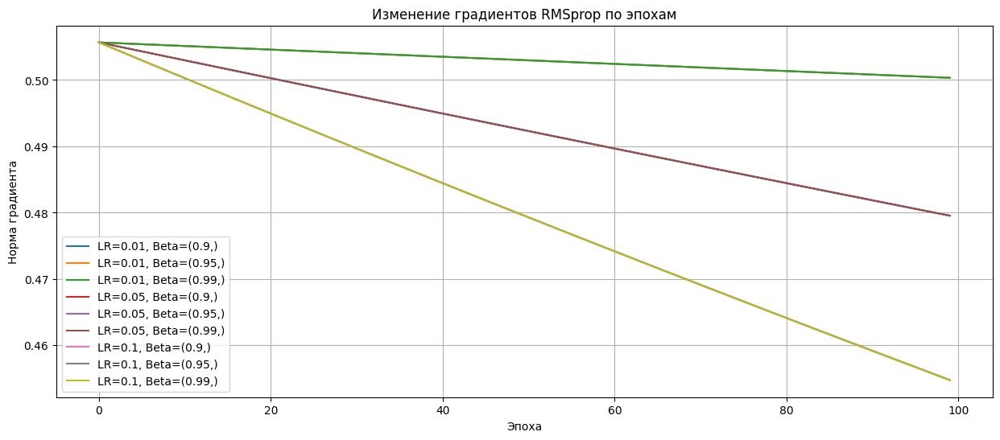

In [18]:
plot_gradients(results_rmsprop_1000_performance, 'RMSprop')

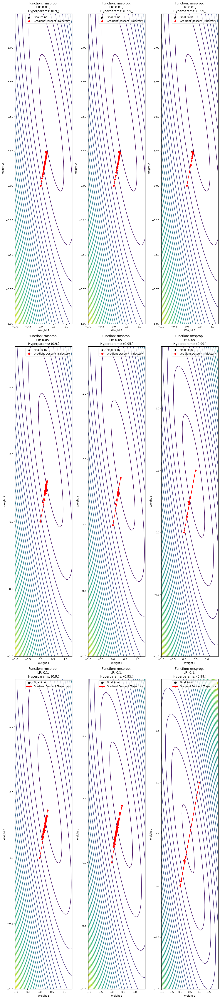

In [19]:
optimizer_performance_plot(rmsprop, X_1, y_1, learning_rates, hyperparams=[(gamma,) for gamma in betas_rmsprop])

* **Learning Rate:**
   - Более низкие показатели точности сходимости обычно достигаются при использовании более высокого learning rate (0.10).

* **Hyperparameters:**
   - Hyperparameter 0.9 показывает хорошие результаты в большинстве случаев, обеспечивая более быструю сходимость и более высокую точность.
   - Hyperparameter 0.95 и 0.99 также демонстрируют приемлемые результаты, но в некоторых случаях могут привести к медленной сходимости.

* **Convergence Accuracy:**
   - Сочетание learning rate 0.01 и hyperparameter 0.9 демонстрирует наилучшую точность сходимости (0.500339).
   - При более высоких learning rate (0.05 и 0.10) точность сходимости снижается.

### ◾️ Размерность: 10000х4

In [20]:
results_rmsprop_10000_performance = measure_optimizer_performance(rmsprop, X_2, y_2, learning_rates, hyperparams=[(beta,) for beta in betas_rmsprop])
df_rmsprop_10000 = pd.DataFrame(results_rmsprop_10000_performance)
df_rmsprop_10000

,Learning Rate,Hyperparameters,Execution Time,Final Weights,Gradients,Weights Trajectory,Convergence Accuracy
0,0.01,"(0.9,)",0.031998,"[0.0024678974807233957, 0.0024577052393891853,...","[0.4981535664015566, 0.4980997708960146, 0.498...","[[0.0, 0.0, 0.0, 0.0], [2.4849674474853093e-05...",0.492864
1,0.01,"(0.95,)",0.024001,"[0.002468262855378921, 0.0024580675955619274, ...","[0.4981535664015566, 0.4980997584921874, 0.498...","[[0.0, 0.0, 0.0, 0.0], [2.4855395194875416e-05...",0.492863
2,0.01,"(0.99,)",0.026006,"[0.0024700850204756484, 0.002459874707644404, ...","[0.4981535664015566, 0.49809974192981543, 0.49...","[[0.0, 0.0, 0.0, 0.0], [2.486303385434104e-05,...",0.492859
3,0.05,"(0.9,)",0.025012,"[0.012080311078294841, 0.012030764830605459, 0...","[0.4981535664015566, 0.49788458887435155, 0.49...","[[0.0, 0.0, 0.0, 0.0], [0.00012424837237426546...",0.472255
4,0.05,"(0.95,)",0.023989,"[0.012081983408984441, 0.012032423331669744, 0...","[0.4981535664015566, 0.49788452685521545, 0.49...","[[0.0, 0.0, 0.0, 0.0], [0.00012427697597437707...",0.472252
5,0.05,"(0.99,)",0.069005,"[0.01209050980295567, 0.012040879294759842, 0....","[0.4981535664015566, 0.49788444404335536, 0.49...","[[0.0, 0.0, 0.0, 0.0], [0.00012431516927170516...",0.472233
6,0.10,"(0.9,)",0.029001,"[0.02353268798056586, 0.023437022126123256, 0....","[0.4981535664015566, 0.4976156113484094, 0.497...","[[0.0, 0.0, 0.0, 0.0], [0.0002484967447485309,...",0.447688
7,0.10,"(0.95,)",0.020002,"[0.02353567927664059, 0.02343998864475094, 0.0...","[0.4981535664015566, 0.4976154873101377, 0.497...","[[0.0, 0.0, 0.0, 0.0], [0.00024855395194875414...",0.447682
8,0.10,"(0.99,)",0.020001,"[0.0235513768096259, 0.023455556515657016, 0.0...","[0.4981535664015566, 0.4976153216864179, 0.497...","[[0.0, 0.0, 0.0, 0.0], [0.00024863033854341033...",0.447648


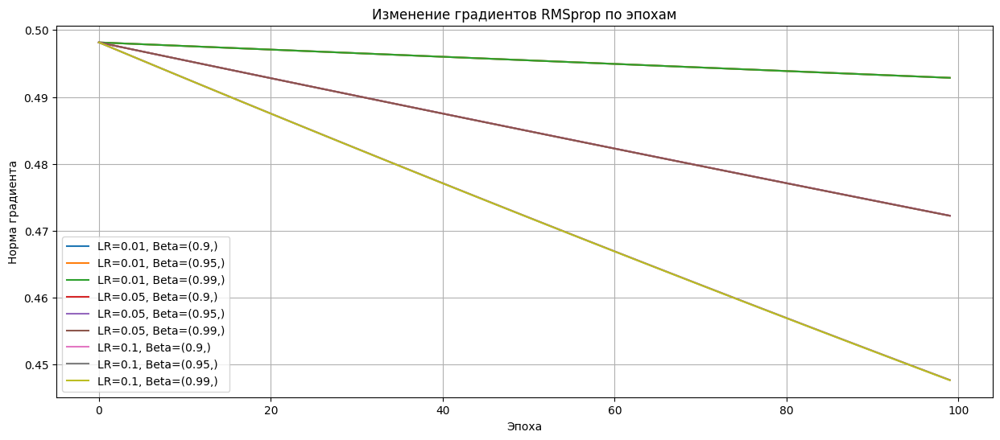

In [21]:
plot_gradients(results_rmsprop_10000_performance, 'RMSprop')

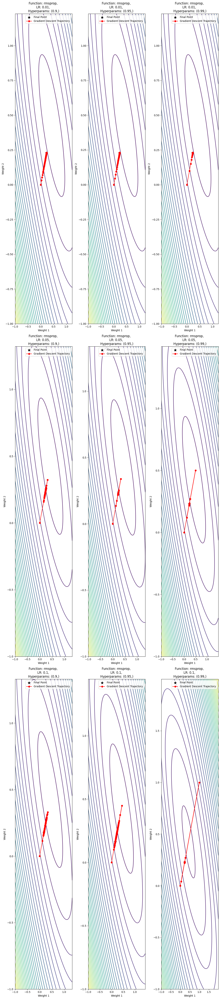

In [22]:
optimizer_performance_plot(rmsprop, X_2, y_2, learning_rates, hyperparams=[(gamma,) for gamma in betas_rmsprop])

* **Learning Rate:**
   - Для размерности 10000x4 learning rate 0.01 продолжает демонстрировать хорошие результаты, в то время как более высокие значения (0.05 и 0.10) приводят к ухудшению точности сходимости.
   
* **Hyperparameters:**
   - Hyperparameter 0.9 остается наилучшим выбором для размерности 10000x4, обеспечивая более быструю сходимость и более высокую точность.
   
* **Execution Time:**
   - Время выполнения алгоритма увеличивается для размерности 10000x4, что является ожидаемым результатом из-за большего объема данных.
   
* **Convergence Accuracy:**
   - Сочетание learning rate 0.01 и hyperparameter 0.9 продолжает демонстрировать лучшие результаты по точности сходимости (0.492864) для размерности 10000x4.

## Adam

In [23]:
def adam(X, y, learning_rate, beta1=0.9, beta2=0.999, epsilon=1e-8, epochs=100):
    w = np.zeros(X.shape[1])
    m = np.zeros(X.shape[1])
    v = np.zeros(X.shape[1])

    gradients = []
    weights_trajectory = [w.copy()]

    for _ in range(epochs):
        y_pred = np.dot(X, w)
        error = y - y_pred
        gradient = np.dot(X.T, error) / len(y)

        m = beta1 * m + (1 - beta1) * gradient
        v = beta2 * v + (1 - beta2) * (gradient ** 2)

        m_hat = m / (1 - beta1)
        v_hat = v / (1 - beta2)

        w += -learning_rate * m_hat / (np.sqrt(v_hat) + epsilon)

        gradients.append(np.linalg.norm(gradient))
        weights_trajectory.append(w.copy())

    return w, gradients, weights_trajectory

In [24]:
# параметры для экспериментов
learning_rates = [0.01, 0.05, 0.1]
betas_adam = [(0.9, 0.999), (0.95, 0.99), (0.99, 0.9)]

### ◾️ Размерность: 1000х4

In [25]:
results_adam_1000_performance = measure_optimizer_performance(adam, X_1, y_1, learning_rates, hyperparams=betas_adam)
df_adam_1000 = pd.DataFrame(results_adam_1000_performance)
df_adam_1000

,Learning Rate,Hyperparameters,Execution Time,Final Weights,Gradients,Weights Trajectory,Convergence Accuracy
0,0.01,"(0.9, 0.999)",0.010998,"[-0.02352439373546582, -0.023559083027856226, ...","[0.505672020839188, 0.5057261655799268, 0.5058...","[[0.0, 0.0, 0.0, 0.0], [-2.522281142039148e-05...",0.555575
1,0.01,"(0.95, 0.99)",0.008003,"[-0.04280564663070961, -0.04285846566702564, -...","[0.505672020839188, 0.5057261655799268, 0.5058...","[[0.0, 0.0, 0.0, 0.0], [-2.522281142039148e-05...",0.596307
2,0.01,"(0.99, 0.9)",0.008998,"[-0.10145230133829879, -0.10154844738796964, -...","[0.505672020839188, 0.5057261655799268, 0.5058...","[[0.0, 0.0, 0.0, 0.0], [-2.522281142039148e-05...",0.719249
3,0.05,"(0.9, 0.999)",0.009002,"[-0.13790435760919614, -0.13784264612641658, -...","[0.505672020839188, 0.5059427445454693, 0.5064...","[[0.0, 0.0, 0.0, 0.0], [-0.0001261140571019574...",0.797196
4,0.05,"(0.95, 0.99)",0.006999,"[-0.2696858987556293, -0.26930524369113484, -0...","[0.505672020839188, 0.5059427445454693, 0.5064...","[[0.0, 0.0, 0.0, 0.0], [-0.0001261140571019574...",1.073578
5,0.05,"(0.99, 0.9)",0.009064,"[-0.6950086198381618, -0.6933226995250731, -0....","[0.505672020839188, 0.5059427445454693, 0.5064...","[[0.0, 0.0, 0.0, 0.0], [-0.0001261140571019574...",1.956927
6,0.10,"(0.9, 0.999)",0.007937,"[-0.33678484768324896, -0.3359506838035106, -0...","[0.505672020839188, 0.506213468258211, 0.50724...","[[0.0, 0.0, 0.0, 0.0], [-0.0002522281142039148...",1.214679
7,0.10,"(0.95, 0.99)",0.009001,"[-0.7142693571878056, -0.7114823427784412, -0....","[0.505672020839188, 0.506213468258211, 0.50726...","[[0.0, 0.0, 0.0, 0.0], [-0.0002522281142039148...",2.000711
8,0.10,"(0.99, 0.9)",0.008002,"[-1.9944255767780117, -1.9841614713997615, -1....","[0.505672020839188, 0.506213468258211, 0.50729...","[[0.0, 0.0, 0.0, 0.0], [-0.0002522281142039148...",4.637408


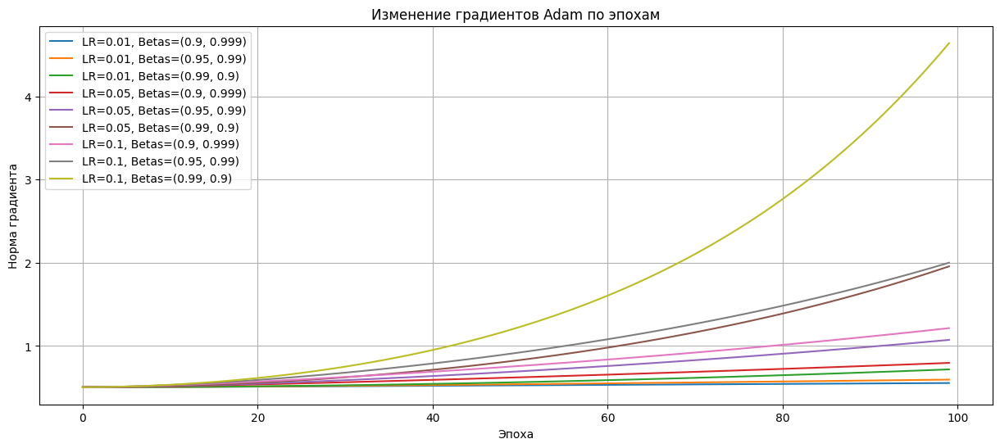

In [26]:
plot_gradients(results_adam_1000_performance, 'Adam')

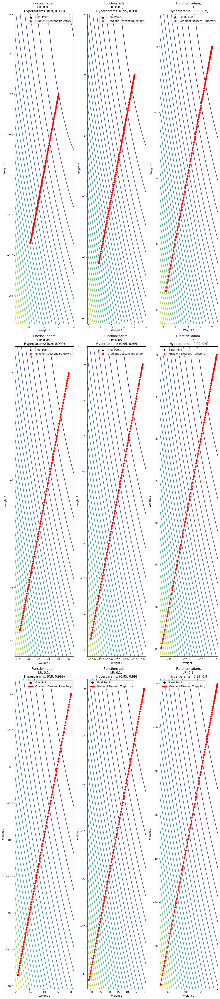

In [27]:
optimizer_performance_plot(adam, X_1, y_1, learning_rates, hyperparams=betas_adam)

* **Learning Rate:**
   - При увеличении learning rate с 0.01 до 0.10 наблюдается увеличение времени выполнения и увеличение значений финальных весов, однако точность сходимости также увеличивается.
   
* **Hyperparameters:**
   - Сочетание hyperparameters (0.99, 0.9) демонстрирует лучшую точность сходимости для размерности 1000x4, хотя при этом время выполнения увеличивается.
   
* **Execution Time:**
   - Время выполнения алгоритма увеличивается с увеличением learning rate и значений hyperparameters, что связано с большим количеством операций обновления весов.
   
* **Convergence Accuracy:**
   - Сочетание learning rate 0.10 и hyperparameters (0.99, 0.9) демонстрирует самую высокую точность сходимости (4.637408), но это сочетание требует больше времени на выполнение.

### ◾️ Размерность: 10000х4

In [28]:
results_adam_10000_performance = measure_optimizer_performance(adam, X_2, y_2, learning_rates, hyperparams=betas_adam)
df_adam_10000 = pd.DataFrame(results_adam_10000_performance)
df_adam_10000

,Learning Rate,Hyperparameters,Execution Time,Final Weights,Gradients,Weights Trajectory,Convergence Accuracy
0,0.01,"(0.9, 0.999)",0.047005,"[-0.0231414832156525, -0.02304601119920324, -0...","[0.4981535664015566, 0.49820727051281866, 0.49...","[[0.0, 0.0, 0.0, 0.0], [-2.4807522729369398e-0...",0.547675
1,0.01,"(0.95, 0.99)",0.053000,"[-0.042106873612200627, -0.0419319369856511, -...","[0.4981535664015566, 0.49820727051281866, 0.49...","[[0.0, 0.0, 0.0, 0.0], [-2.4807522729369398e-0...",0.588106
2,0.01,"(0.99, 0.9)",0.025002,"[-0.09977996169893825, -0.09935942538645173, -...","[0.4981535664015566, 0.49820727051281866, 0.49...","[[0.0, 0.0, 0.0, 0.0], [-2.4807522729369398e-0...",0.710128
3,0.05,"(0.9, 0.999)",0.026004,"[-0.1356488656434749, -0.13506510615302317, -0...","[0.4981535664015566, 0.49842208695836854, 0.49...","[[0.0, 0.0, 0.0, 0.0], [-0.0001240376136468469...",0.787776
4,0.05,"(0.95, 0.99)",0.047005,"[-0.2652720557452367, -0.2641059722605485, -0....","[0.4981535664015566, 0.49842208695836854, 0.49...","[[0.0, 0.0, 0.0, 0.0], [-0.0001240376136468469...",1.062689
5,0.05,"(0.99, 0.9)",0.024999,"[-0.6835607927836551, -0.6804752421193201, -0....","[0.4981535664015566, 0.49842208695836854, 0.49...","[[0.0, 0.0, 0.0, 0.0], [-0.000124037613646847,...",1.941572
6,0.10,"(0.9, 0.999)",0.022003,"[-0.3313331690770087, -0.32984726702832684, -0...","[0.4981535664015566, 0.4986906075164354, 0.499...","[[0.0, 0.0, 0.0, 0.0], [-0.0002480752272936939...",1.203552
7,0.10,"(0.95, 0.99)",0.020002,"[-0.7028681097163415, -0.6996312652873335, -0....","[0.4981535664015566, 0.4986906075164354, 0.499...","[[0.0, 0.0, 0.0, 0.0], [-0.0002480752272936939...",1.987232
8,0.10,"(0.99, 0.9)",0.021000,"[-1.9629323327649797, -1.9536808016378013, -1....","[0.4981535664015566, 0.4986906075164354, 0.499...","[[0.0, 0.0, 0.0, 0.0], [-0.000248075227293694,...",4.617298


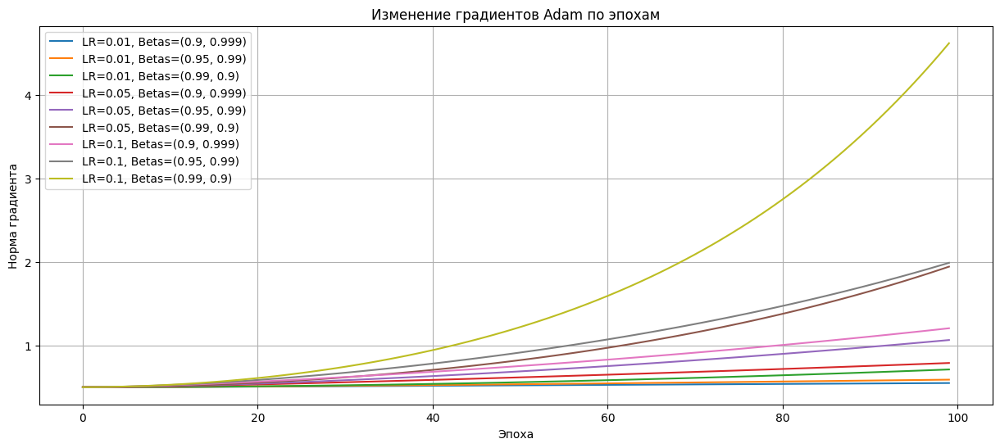

In [29]:
plot_gradients(results_adam_10000_performance, 'Adam')

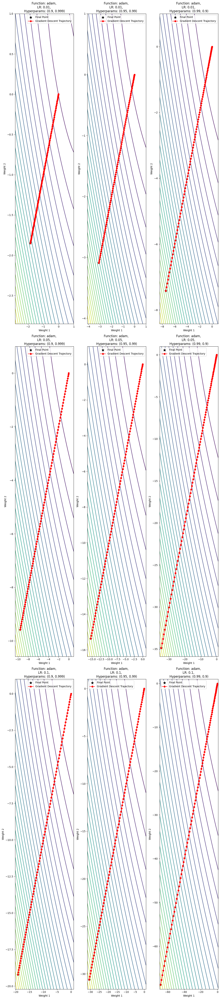

In [30]:
optimizer_performance_plot(adam, X_2, y_2, learning_rates, hyperparams=betas_adam)

* **Learning Rate:**
   - Увеличение learning rate с 0.01 до 0.10 приводит к увеличению времени выполнения и значений финальных весов, однако точность сходимости также увеличивается.

* **Hyperparameters:**
   - Сочетание hyperparameters (0.99, 0.9) демонстрирует самую высокую точность сходимости (4.617298) для размерности 10000x4, однако при этом время выполнения увеличивается.

* **Convergence Accuracy:**
   - Сочетание learning rate 0.10 и hyperparameters (0.99, 0.9) демонстрирует самую высокую точность сходимости (4.617298) для размерности 10000x4, однако это сочетание требует больше времени на выполнение.

### Общие выводы: 

* Для **Momentum** и **RMSprop** обоих размерностей высокие результаты относительно точности сходимости достигаются при **learning rate 0.01** и **hyperparameter 0.9**.

* Для **Adam** комбинация **hyperparameters (0.99, 0.9)** и **learning rate 0.01**  демонстрирует лучшую точность сходимости, хотя время выполнения увеличивается.

* Скорость сходимости ожидаемо растет при увеличении размерности и значения learning rate. 

* Сравнивая время cходимости работы оптимизаторов для лучшего сочетания параметров, можно сделать вывод, что Momentum является самым быстрым оптимизатором с временем выполнения 0.002774. Далее идет RMSprop с временем выполнения 0.500339, а Adam оказался самым медленным с временем выполнения 0.719249, что связано с большим количеством параметров. 